In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")


Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented/"
x = load(os.path.join(path, 'train/Train_3221.jpg'))
print(x.shape)

(300, 300, 3)


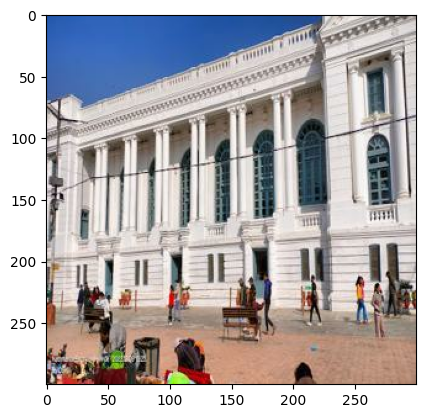

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

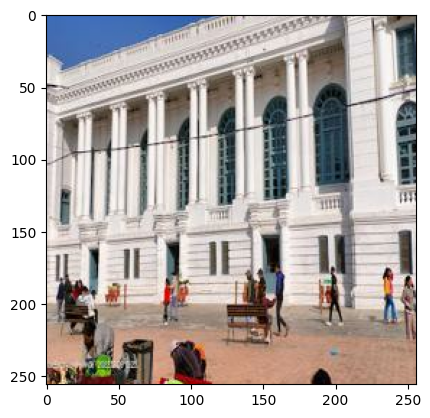

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

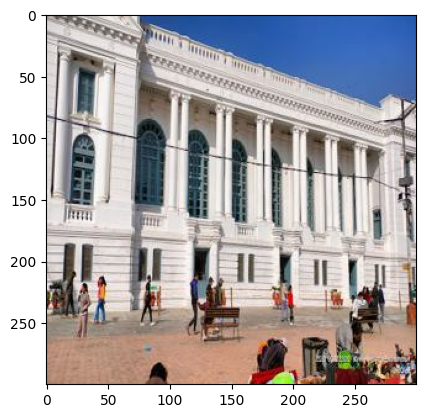

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 32

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
test_dataset = tf.data.Dataset.list_files(path + 'val/*.jpg')
test_dataset = test_dataset.map(load_test_image)
test_dataset = test_dataset.batch(BATCH_SIZE)
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [21]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [22]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(64, 4, batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4, dropout = True),
        downsample(512, 4, dropout = True),
        downsample(512, 4, dropout = True),
        downsample(512, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4),
        upsample(64, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

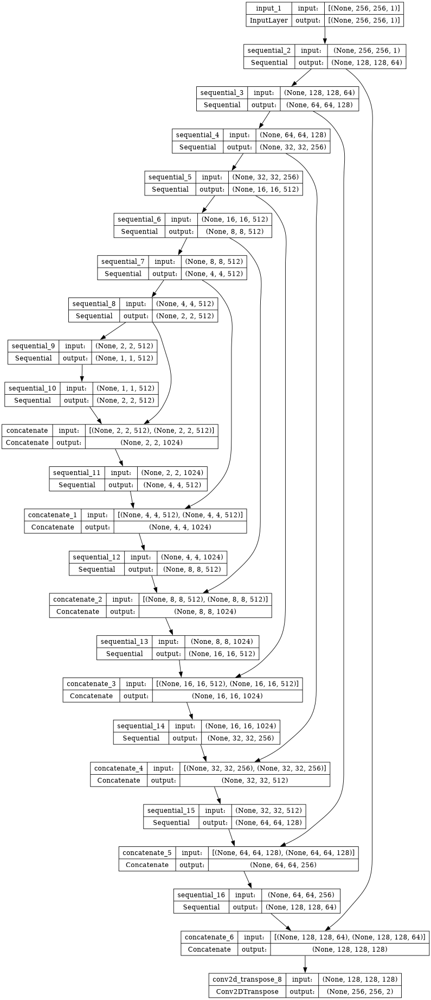

In [23]:
gen = generator()
plot_model(gen, show_shapes=True, dpi = 64)

In [24]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

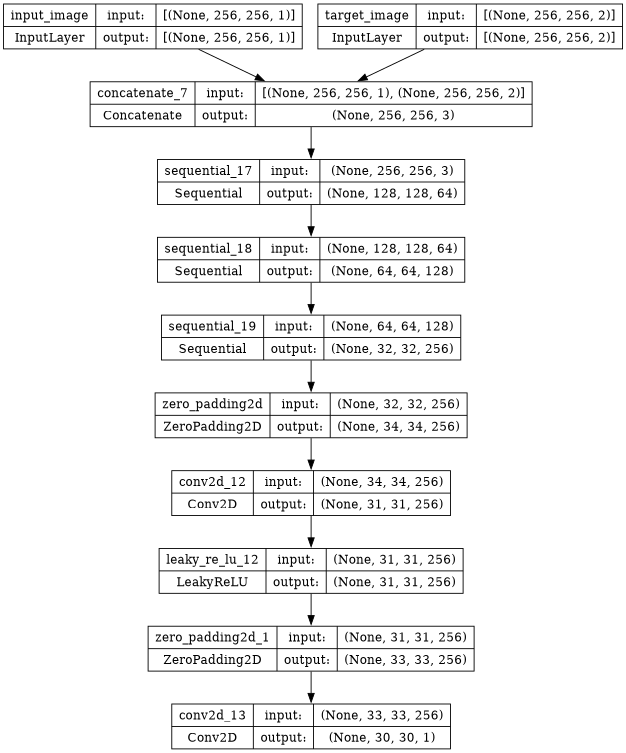

In [25]:
disc = discriminator()
plot_model(disc, show_shapes=True, dpi = 64)

In [26]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [27]:
LAMBDA = 50

In [28]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss

In [29]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [30]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [31]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [32]:
epochs = 200

In [33]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

        ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        if epoch > 10:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values

In [34]:
@tf.function
def test_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

    ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values


In [35]:
os.mkdir('/kaggle/working/gen_output/')

In [36]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))

In [37]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


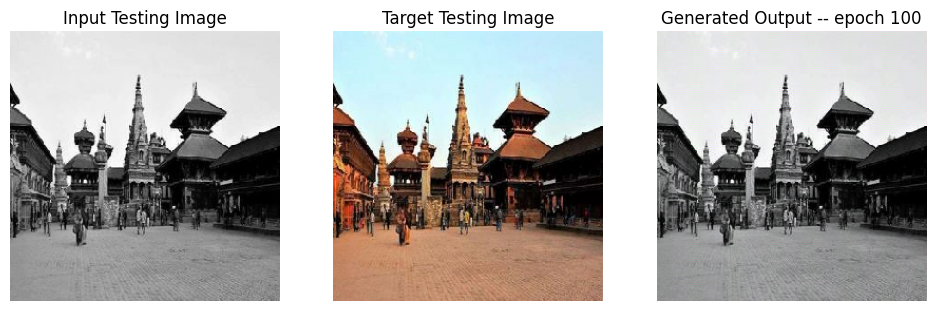

SSIM Score: 0.8519298434257507
PSNR Score: 19.949798583984375


In [38]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_3.jpg',100)

In [39]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
testing_ssim = []
testing_psnr = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_gan_losses, test_generator_l1_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate

    for epoch in range(epochs):
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            train_count += 1
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.2f} gan_loss:{:.2f} l1_loss:{:.2f} Discriminator-- total_loss:{:.2f} real_loss:{:.2f} generated_loss:{:.2f} --- SSIM {:.2f} PSNR {:.2f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print("Number of iteration {d}", train_count)

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr = test_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
        print("Testing Details")
        print("Generator-- total_loss:{:.2f} gan_loss:{:.2f} l1_loss:{:.2f} Discriminator-- total_loss:{:.2f} real_loss:{:.2f} generated_loss:{:.2f} --- SSIM {:.2f} PSNR {:.2f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}: and Lambda = {LAMBDA}")
        LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr),LAMBDA])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        if epoch == 0 or epoch % 5 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_3.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if epoch > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
        LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.5, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.5, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [40]:
tf.config.run_functions_eagerly(True)

Epoch 0
Training Details
Generator-- total_loss:3.24 gan_loss:0.89 l1_loss:0.05 Discriminator-- total_loss:1.40 real_loss:0.73 generated_loss:0.67 --- SSIM 0.87 PSNR 22.32
Time taken for epoch 1 is 177.38687467575073 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:7.38 gan_loss:1.15 l1_loss:0.12 Discriminator-- total_loss:1.30 real_loss:0.44 generated_loss:0.86 --- SSIM 0.77 PSNR 14.87
Time taken for epoch 1 is 191.50385093688965 sec
Number of iteration 70: and Lambda = 50
Displaying one random test image...


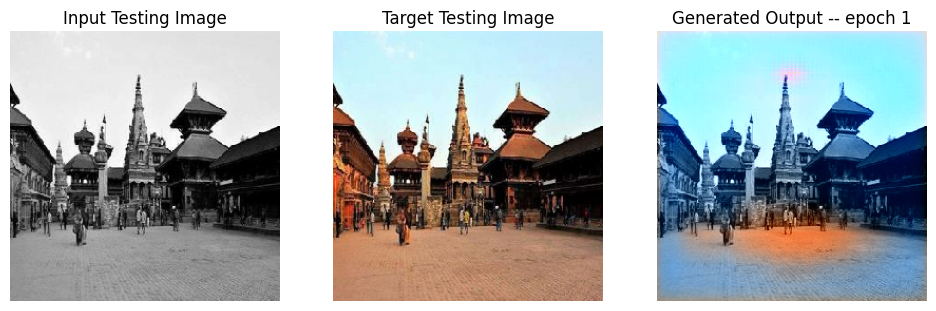

SSIM Score: 0.7321431040763855
PSNR Score: 14.125520706176758
Epoch 1
Training Details
Generator-- total_loss:2.82 gan_loss:0.82 l1_loss:0.04 Discriminator-- total_loss:1.35 real_loss:0.68 generated_loss:0.67 --- SSIM 0.93 PSNR 23.54
Time taken for epoch 2 is 170.67814874649048 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.99 gan_loss:1.17 l1_loss:0.06 Discriminator-- total_loss:1.51 real_loss:0.43 generated_loss:1.09 --- SSIM 0.91 PSNR 20.95
Time taken for epoch 2 is 184.10347080230713 sec
Number of iteration 70: and Lambda = 50.45089999999999
Epoch 2
Training Details
Generator-- total_loss:3.12 gan_loss:1.04 l1_loss:0.04 Discriminator-- total_loss:1.91 real_loss:0.97 generated_loss:0.93 --- SSIM 0.92 PSNR 23.34
Time taken for epoch 3 is 171.8167040348053 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.74 gan_loss:1.30 l1_loss:0.05 Discriminator-- total_loss:1.58 real_loss:0.35 generated_loss:1.23 --- SSIM 0.92 PSNR 22.24
Time taken 

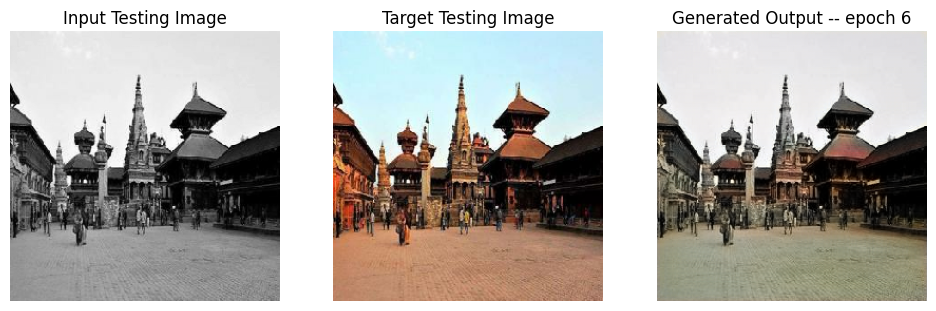

SSIM Score: 0.9636833071708679
PSNR Score: 21.816984176635742
Epoch 6
Training Details
Generator-- total_loss:2.80 gan_loss:0.78 l1_loss:0.04 Discriminator-- total_loss:1.36 real_loss:0.68 generated_loss:0.68 --- SSIM 0.94 PSNR 23.69
Time taken for epoch 7 is 170.94597244262695 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.61 gan_loss:0.49 l1_loss:0.04 Discriminator-- total_loss:1.47 real_loss:1.00 generated_loss:0.47 --- SSIM 0.94 PSNR 23.91
Time taken for epoch 7 is 184.3200695514679 sec
Number of iteration 70: and Lambda = 52.7671316039075
Epoch 7
Training Details
Generator-- total_loss:2.80 gan_loss:0.77 l1_loss:0.04 Discriminator-- total_loss:1.35 real_loss:0.67 generated_loss:0.68 --- SSIM 0.94 PSNR 23.73
Time taken for epoch 8 is 170.9295997619629 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.08 gan_loss:0.75 l1_loss:0.04 Discriminator-- total_loss:1.38 real_loss:0.67 generated_loss:0.71 --- SSIM 0.94 PSNR 23.24
Time taken fo

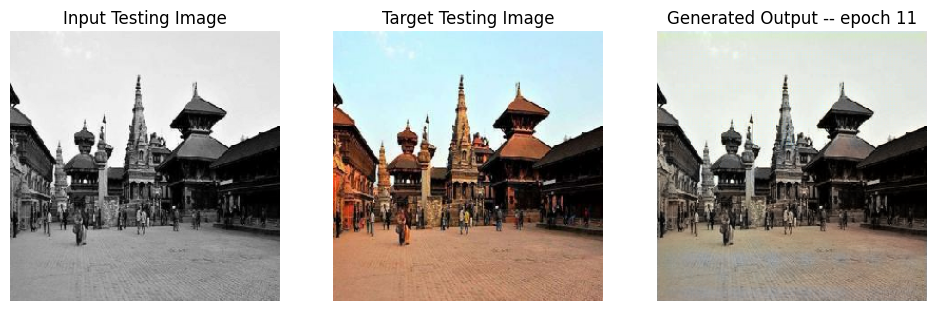

SSIM Score: 0.9292528033256531
PSNR Score: 21.690309524536133
Epoch 11
Training Details
Generator-- total_loss:6.23 gan_loss:4.23 l1_loss:0.04 Discriminator-- total_loss:0.51 real_loss:0.26 generated_loss:0.26 --- SSIM 0.94 PSNR 24.10
Time taken for epoch 12 is 117.00958847999573 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.90 gan_loss:0.64 l1_loss:0.04 Discriminator-- total_loss:2.03 real_loss:1.44 generated_loss:0.60 --- SSIM 0.94 PSNR 23.74
Time taken for epoch 12 is 130.59692430496216 sec
Number of iteration 70: and Lambda = 55.189702814104294
Epoch 12
Training Details
Generator-- total_loss:8.11 gan_loss:6.10 l1_loss:0.04 Discriminator-- total_loss:0.27 real_loss:0.15 generated_loss:0.12 --- SSIM 0.94 PSNR 24.12
Time taken for epoch 13 is 116.92801475524902 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.71 gan_loss:0.41 l1_loss:0.04 Discriminator-- total_loss:1.99 real_loss:1.71 generated_loss:0.28 --- SSIM 0.94 PSNR 23.64
Time

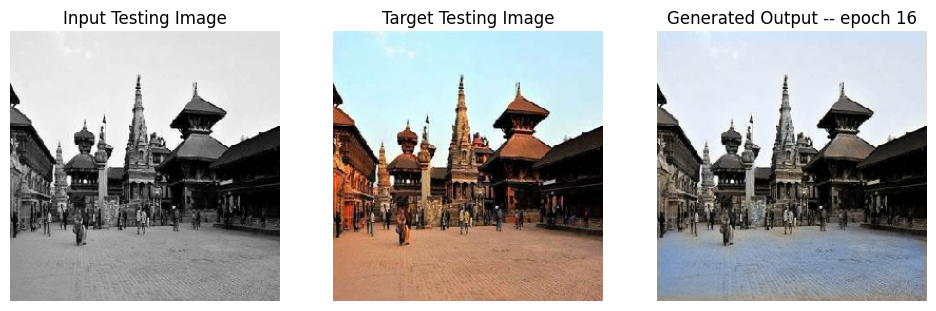

SSIM Score: 0.9435511231422424
PSNR Score: 19.327556610107422
Epoch 16
Training Details
Generator-- total_loss:14.02 gan_loss:11.93 l1_loss:0.04 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.94 PSNR 24.10
Time taken for epoch 17 is 116.27102994918823 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.72 gan_loss:0.32 l1_loss:0.04 Discriminator-- total_loss:2.82 real_loss:2.48 generated_loss:0.34 --- SSIM 0.94 PSNR 23.59
Time taken for epoch 17 is 130.01472783088684 sec
Number of iteration 70: and Lambda = 57.723495746803046
Epoch 17
Training Details
Generator-- total_loss:11.75 gan_loss:9.64 l1_loss:0.04 Discriminator-- total_loss:0.65 real_loss:0.33 generated_loss:0.32 --- SSIM 0.94 PSNR 24.10
Time taken for epoch 18 is 116.20283150672913 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.41 gan_loss:0.99 l1_loss:0.04 Discriminator-- total_loss:1.66 real_loss:0.88 generated_loss:0.78 --- SSIM 0.94 PSNR 23.60
T

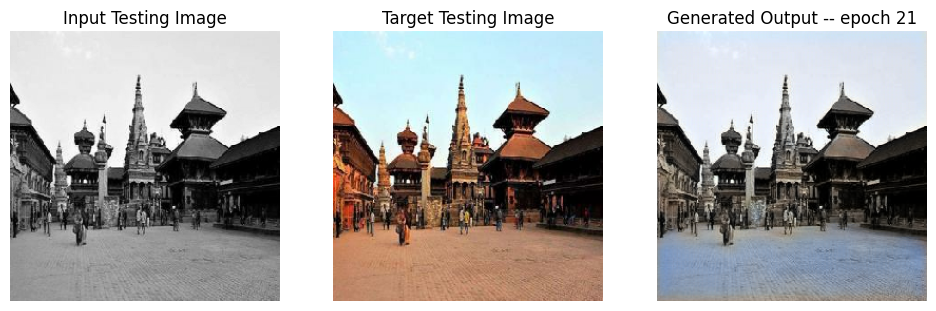

SSIM Score: 0.9435915350914001
PSNR Score: 19.314804077148438
Epoch 21
Training Details
Generator-- total_loss:14.25 gan_loss:12.06 l1_loss:0.04 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.94 PSNR 24.09
Time taken for epoch 22 is 117.0805892944336 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.57 gan_loss:0.07 l1_loss:0.04 Discriminator-- total_loss:5.01 real_loss:4.82 generated_loss:0.19 --- SSIM 0.94 PSNR 23.59
Time taken for epoch 22 is 130.66148376464844 sec
Number of iteration 70: and Lambda = 60.37361665915081
Epoch 22
Training Details
Generator-- total_loss:14.67 gan_loss:12.45 l1_loss:0.04 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.94 PSNR 24.08
Time taken for epoch 23 is 116.54404354095459 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.57 gan_loss:0.05 l1_loss:0.04 Discriminator-- total_loss:5.22 real_loss:5.09 generated_loss:0.13 --- SSIM 0.94 PSNR 23.59
Ti

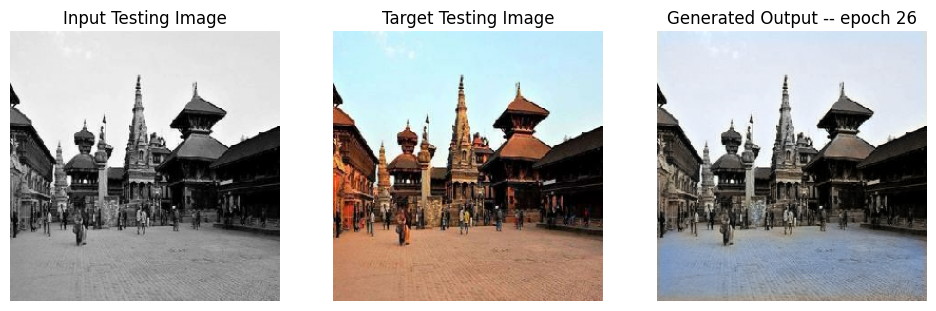

SSIM Score: 0.9437611103057861
PSNR Score: 19.34038543701172
Epoch 26
Training Details
Generator-- total_loss:11.26 gan_loss:8.97 l1_loss:0.04 Discriminator-- total_loss:0.01 real_loss:0.00 generated_loss:0.00 --- SSIM 0.94 PSNR 24.09
Time taken for epoch 27 is 116.9287600517273 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.90 gan_loss:0.27 l1_loss:0.04 Discriminator-- total_loss:2.56 real_loss:2.22 generated_loss:0.33 --- SSIM 0.94 PSNR 23.58
Time taken for epoch 27 is 130.4773497581482 sec
Number of iteration 70: and Lambda = 63.14540623967608
Epoch 27
Training Details
Generator-- total_loss:12.89 gan_loss:10.58 l1_loss:0.04 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.94 PSNR 24.11
Time taken for epoch 28 is 117.07640862464905 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.86 gan_loss:0.21 l1_loss:0.04 Discriminator-- total_loss:3.00 real_loss:2.75 generated_loss:0.25 --- SSIM 0.94 PSNR 23.57
Time 

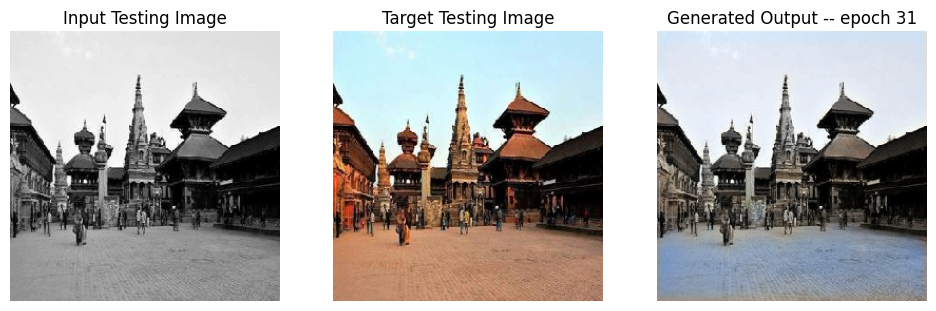

SSIM Score: 0.9435033798217773
PSNR Score: 19.287437438964844
Epoch 31
Training Details
Generator-- total_loss:14.74 gan_loss:12.35 l1_loss:0.04 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.94 PSNR 24.10
Time taken for epoch 32 is 117.23459196090698 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.08 gan_loss:0.34 l1_loss:0.04 Discriminator-- total_loss:2.42 real_loss:2.14 generated_loss:0.28 --- SSIM 0.94 PSNR 23.60
Time taken for epoch 32 is 130.73146438598633 sec
Number of iteration 70: and Lambda = 66.04445037117652
Epoch 32
Training Details
Generator-- total_loss:15.07 gan_loss:12.65 l1_loss:0.04 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.94 PSNR 24.10
Time taken for epoch 33 is 116.83715748786926 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.04 gan_loss:0.27 l1_loss:0.04 Discriminator-- total_loss:2.63 real_loss:2.40 generated_loss:0.23 --- SSIM 0.94 PSNR 23.57
T

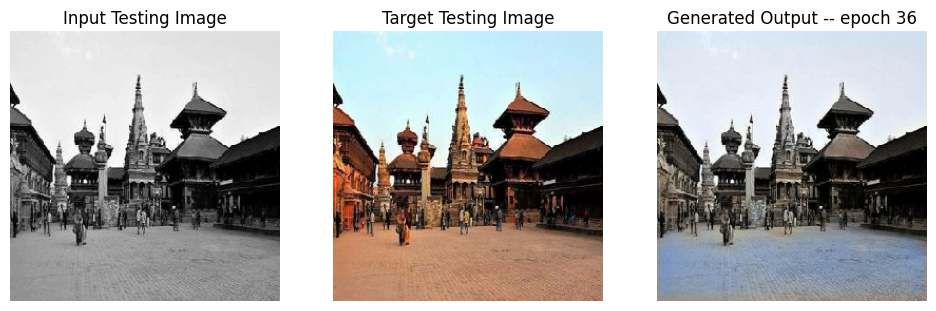

SSIM Score: 0.9436042308807373
PSNR Score: 19.317583084106445
Reduced generator learning rate to 0.0005000000237487257 at epoch 36
Epoch 36
Training Details
Generator-- total_loss:2.52 gan_loss:0.06 l1_loss:0.04 Discriminator-- total_loss:14.11 real_loss:14.11 generated_loss:0.00 --- SSIM 0.95 PSNR 24.24
Time taken for epoch 37 is 107.1963837146759 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.27 gan_loss:0.00 l1_loss:0.05 Discriminator-- total_loss:14.60 real_loss:14.60 generated_loss:0.00 --- SSIM 0.95 PSNR 22.83
Time taken for epoch 37 is 120.89471769332886 sec
Number of iteration 70: and Lambda = 69.0765913877376
Epoch 37
Training Details
Generator-- total_loss:2.27 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:12.94 real_loss:12.94 generated_loss:0.00 --- SSIM 0.95 PSNR 25.10
Time taken for epoch 38 is 107.01498198509216 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.97 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_lo

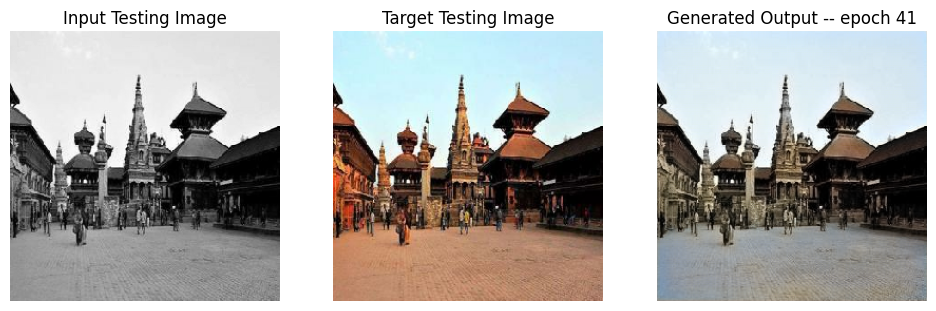

SSIM Score: 0.959101140499115
PSNR Score: 21.70383644104004
Epoch 41
Training Details
Generator-- total_loss:2.27 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:12.23 real_loss:12.23 generated_loss:0.00 --- SSIM 0.96 PSNR 25.39
Time taken for epoch 42 is 106.92135834693909 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.60 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:13.35 real_loss:13.35 generated_loss:0.00 --- SSIM 0.95 PSNR 24.91
Time taken for epoch 42 is 120.3396966457367 sec
Number of iteration 70: and Lambda = 72.24793984856748
Epoch 42
Training Details
Generator-- total_loss:2.27 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:12.15 real_loss:12.15 generated_loss:0.00 --- SSIM 0.96 PSNR 25.51
Time taken for epoch 43 is 106.44600296020508 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.92 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:13.05 real_loss:13.05 generated_loss:0.00 --- SSIM 0.95 PSNR 24.15


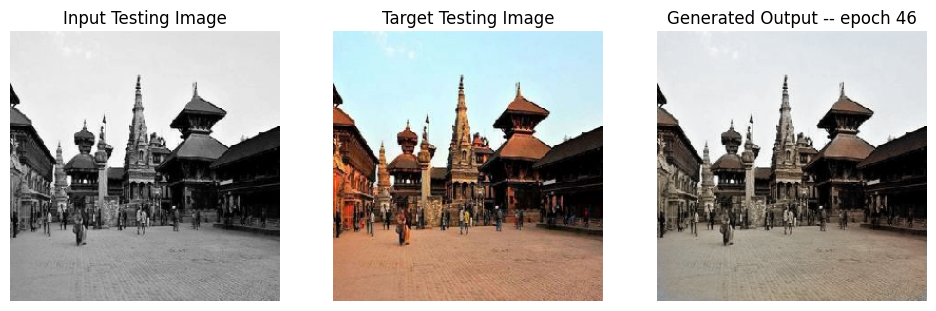

SSIM Score: 0.971163809299469
PSNR Score: 22.524362564086914
Epoch 46
Training Details
Generator-- total_loss:12.50 gan_loss:10.19 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.78
Time taken for epoch 47 is 115.81651520729065 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.93 gan_loss:0.25 l1_loss:0.04 Discriminator-- total_loss:2.61 real_loss:2.29 generated_loss:0.32 --- SSIM 0.95 PSNR 25.04
Time taken for epoch 47 is 129.11335611343384 sec
Number of iteration 70: and Lambda = 75.56488685237636
Epoch 47
Training Details
Generator-- total_loss:13.43 gan_loss:11.09 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.78
Time taken for epoch 48 is 115.48365354537964 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:2.91 gan_loss:0.21 l1_loss:0.04 Discriminator-- total_loss:2.95 real_loss:2.67 generated_loss:0.28 --- SSIM 0.95 PSNR 25.04
Ti

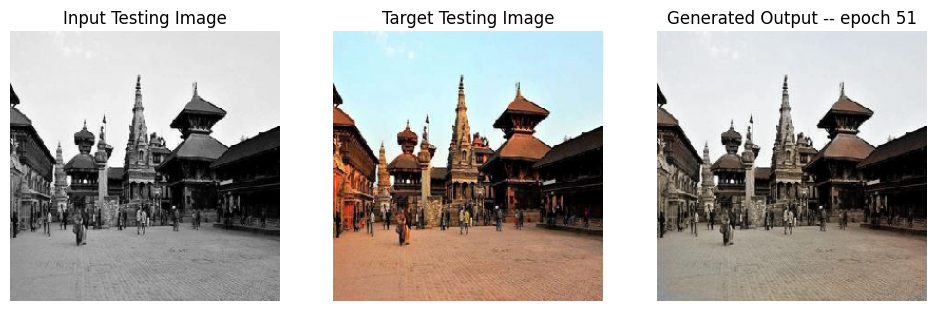

SSIM Score: 0.9710584282875061
PSNR Score: 22.501758575439453
Epoch 51
Training Details
Generator-- total_loss:13.67 gan_loss:11.24 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.77
Time taken for epoch 52 is 115.46010279655457 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.01 gan_loss:0.21 l1_loss:0.04 Discriminator-- total_loss:3.10 real_loss:2.90 generated_loss:0.21 --- SSIM 0.95 PSNR 25.05
Time taken for epoch 52 is 128.72337460517883 sec
Number of iteration 70: and Lambda = 79.03411691711592
Epoch 52
Training Details
Generator-- total_loss:14.19 gan_loss:11.74 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.78
Time taken for epoch 53 is 115.37001252174377 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.04 gan_loss:0.21 l1_loss:0.04 Discriminator-- total_loss:3.30 real_loss:3.07 generated_loss:0.22 --- SSIM 0.95 PSNR 25.04
T

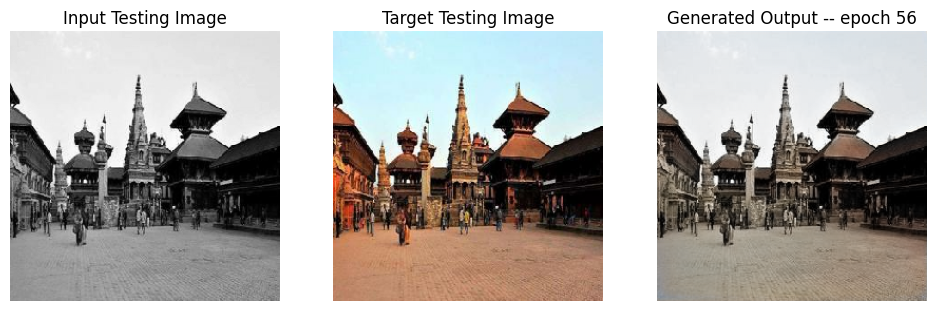

SSIM Score: 0.9710718989372253
PSNR Score: 22.493980407714844
Epoch 56
Training Details
Generator-- total_loss:14.78 gan_loss:12.25 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.78
Time taken for epoch 57 is 114.69218397140503 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.44 gan_loss:0.51 l1_loss:0.04 Discriminator-- total_loss:2.85 real_loss:2.50 generated_loss:0.35 --- SSIM 0.95 PSNR 25.04
Time taken for epoch 57 is 127.71190309524536 sec
Number of iteration 70: and Lambda = 82.66262145103593
Epoch 57
Training Details
Generator-- total_loss:15.40 gan_loss:12.85 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.79
Time taken for epoch 58 is 114.46460843086243 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.29 gan_loss:0.33 l1_loss:0.04 Discriminator-- total_loss:3.29 real_loss:2.98 generated_loss:0.31 --- SSIM 0.95 PSNR 25.04
T

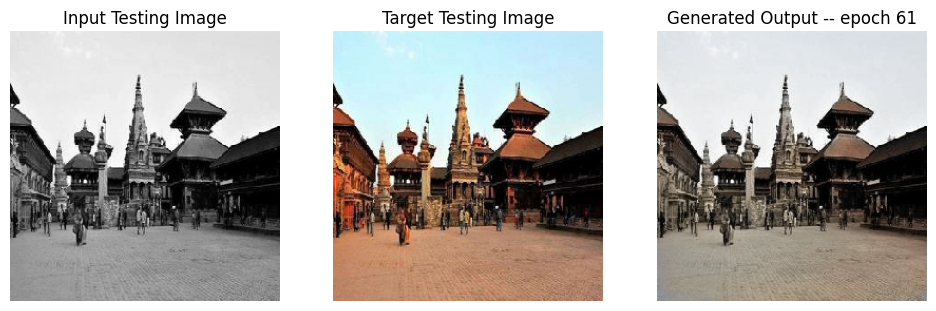

SSIM Score: 0.9711233973503113
PSNR Score: 22.520896911621094
Reduced generator learning rate to 0.0002500000118743628 at epoch 61
Epoch 61
Training Details
Generator-- total_loss:2.80 gan_loss:0.06 l1_loss:0.03 Discriminator-- total_loss:11.12 real_loss:11.12 generated_loss:0.00 --- SSIM 0.95 PSNR 25.27
Time taken for epoch 62 is 104.85886311531067 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.20 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:12.96 real_loss:12.96 generated_loss:0.00 --- SSIM 0.95 PSNR 24.57
Time taken for epoch 62 is 117.83383440971375 sec
Number of iteration 70: and Lambda = 86.457712842205
Epoch 62
Training Details
Generator-- total_loss:2.71 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:11.06 real_loss:11.06 generated_loss:0.00 --- SSIM 0.95 PSNR 25.54
Time taken for epoch 63 is 105.22264862060547 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.14 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_lo

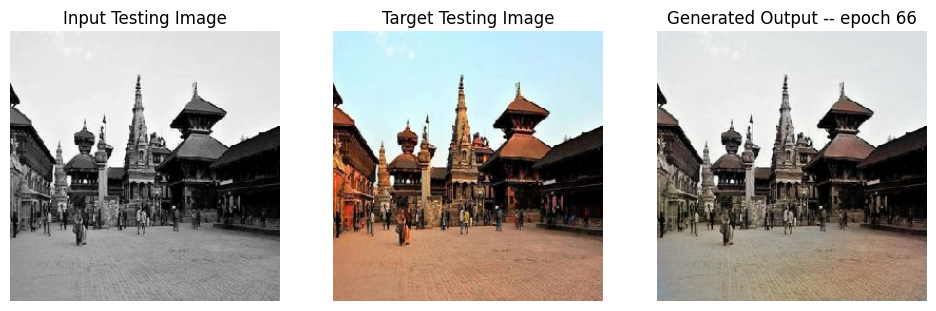

SSIM Score: 0.969531238079071
PSNR Score: 22.34808921813965
Epoch 66
Training Details
Generator-- total_loss:2.77 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:11.68 real_loss:11.68 generated_loss:0.00 --- SSIM 0.96 PSNR 25.67
Time taken for epoch 67 is 105.38335132598877 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.30 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:13.88 real_loss:13.88 generated_loss:0.00 --- SSIM 0.95 PSNR 24.77
Time taken for epoch 67 is 118.40490388870239 sec
Number of iteration 70: and Lambda = 90.42703919488999
Epoch 67
Training Details
Generator-- total_loss:2.78 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:10.70 real_loss:10.70 generated_loss:0.00 --- SSIM 0.96 PSNR 25.76
Time taken for epoch 68 is 104.92138695716858 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.45 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:12.31 real_loss:12.31 generated_loss:0.00 --- SSIM 0.95 PSNR 24.57

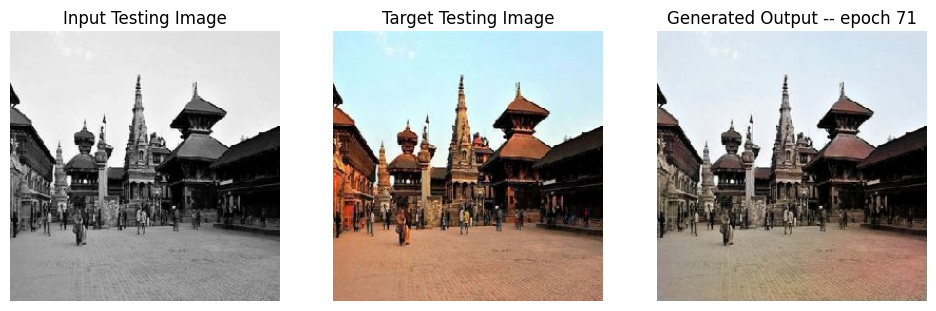

SSIM Score: 0.9709474444389343
PSNR Score: 23.988046646118164
Epoch 71
Training Details
Generator-- total_loss:13.48 gan_loss:10.63 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.87
Time taken for epoch 72 is 113.92795491218567 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.62 gan_loss:0.31 l1_loss:0.04 Discriminator-- total_loss:3.11 real_loss:2.72 generated_loss:0.40 --- SSIM 0.95 PSNR 25.12
Time taken for epoch 72 is 127.03620195388794 sec
Number of iteration 70: and Lambda = 94.57859974249145
Epoch 72
Training Details
Generator-- total_loss:14.69 gan_loss:11.82 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.85
Time taken for epoch 73 is 114.65264248847961 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.75 gan_loss:0.40 l1_loss:0.04 Discriminator-- total_loss:2.94 real_loss:2.51 generated_loss:0.42 --- SSIM 0.95 PSNR 25.11
T

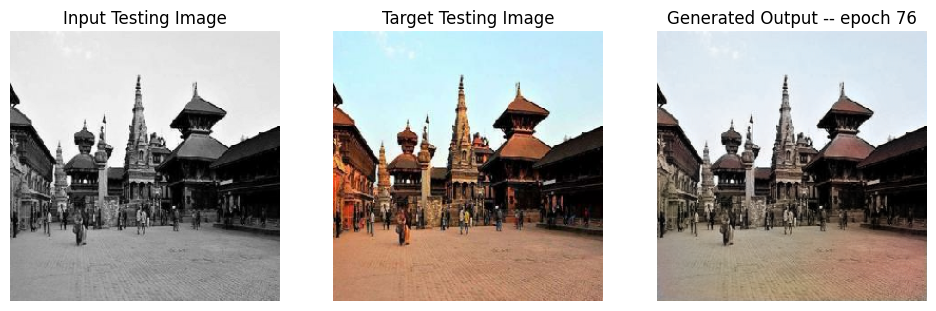

SSIM Score: 0.9709479212760925
PSNR Score: 23.988529205322266
Reduced generator learning rate to 0.0001250000059371814 at epoch 76
Epoch 76
Training Details
Generator-- total_loss:3.21 gan_loss:0.07 l1_loss:0.03 Discriminator-- total_loss:11.16 real_loss:11.16 generated_loss:0.00 --- SSIM 0.95 PSNR 25.18
Time taken for epoch 77 is 105.19261932373047 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.65 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:12.63 real_loss:12.63 generated_loss:0.00 --- SSIM 0.95 PSNR 24.55
Time taken for epoch 77 is 118.27762079238892 sec
Number of iteration 70: and Lambda = 98.92076096809652
Epoch 77
Training Details
Generator-- total_loss:3.06 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:9.91 real_loss:9.91 generated_loss:0.00 --- SSIM 0.96 PSNR 25.48
Time taken for epoch 78 is 105.20248460769653 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.67 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_lo

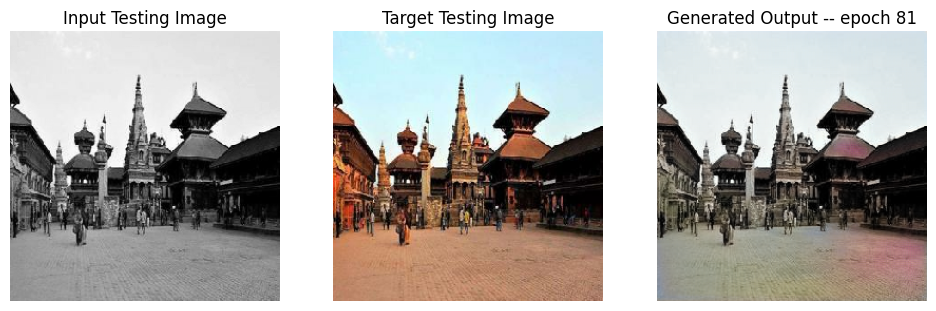

SSIM Score: 0.9650176167488098
PSNR Score: 22.367904663085938
Epoch 81
Training Details
Generator-- total_loss:3.16 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:9.60 real_loss:9.60 generated_loss:0.00 --- SSIM 0.96 PSNR 25.50
Time taken for epoch 82 is 105.4823853969574 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.71 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.56 real_loss:11.56 generated_loss:0.00 --- SSIM 0.95 PSNR 24.84
Time taken for epoch 82 is 118.52549028396606 sec
Number of iteration 70: and Lambda = 103.46227346513591
Epoch 82
Training Details
Generator-- total_loss:3.16 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:8.69 real_loss:8.69 generated_loss:0.00 --- SSIM 0.96 PSNR 25.58
Time taken for epoch 83 is 105.1183214187622 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:3.82 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.30 real_loss:11.30 generated_loss:0.00 --- SSIM 0.95 PSNR 24.76
Ti

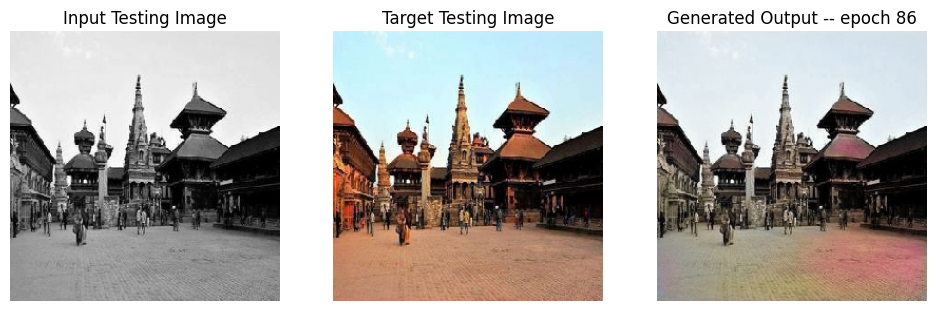

SSIM Score: 0.9668967723846436
PSNR Score: 23.537250518798828
Epoch 86
Training Details
Generator-- total_loss:12.17 gan_loss:8.91 l1_loss:0.03 Discriminator-- total_loss:0.02 real_loss:0.01 generated_loss:0.01 --- SSIM 0.96 PSNR 25.59
Time taken for epoch 87 is 113.81649208068848 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.33 gan_loss:0.52 l1_loss:0.04 Discriminator-- total_loss:1.88 real_loss:1.38 generated_loss:0.50 --- SSIM 0.95 PSNR 24.95
Time taken for epoch 87 is 126.93448877334595 sec
Number of iteration 70: and Lambda = 108.21228957212446
Epoch 87
Training Details
Generator-- total_loss:13.36 gan_loss:10.06 l1_loss:0.03 Discriminator-- total_loss:0.03 real_loss:0.01 generated_loss:0.01 --- SSIM 0.96 PSNR 25.54
Time taken for epoch 88 is 114.35792517662048 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.29 gan_loss:0.43 l1_loss:0.04 Discriminator-- total_loss:2.45 real_loss:1.99 generated_loss:0.46 --- SSIM 0.95 PSNR 24.93
T

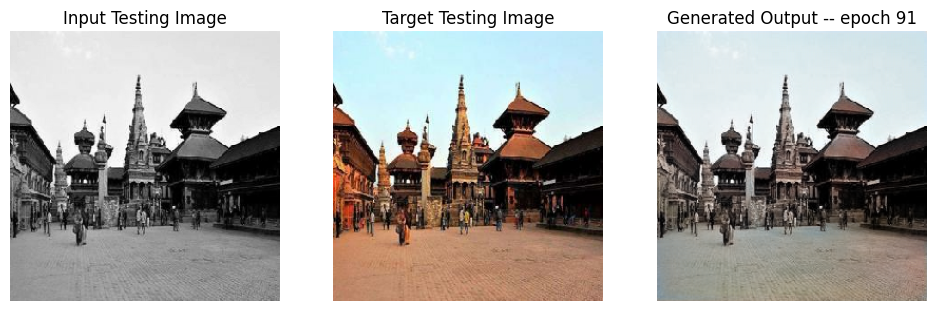

SSIM Score: 0.9655077457427979
PSNR Score: 22.10477066040039
Epoch 91
Training Details
Generator-- total_loss:3.41 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:9.83 real_loss:9.82 generated_loss:0.01 --- SSIM 0.95 PSNR 25.79
Time taken for epoch 92 is 105.33891916275024 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.08 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.35 real_loss:11.35 generated_loss:0.00 --- SSIM 0.94 PSNR 24.89
Time taken for epoch 92 is 118.34399199485779 sec
Number of iteration 70: and Lambda = 113.18038181702288
Epoch 92
Training Details
Generator-- total_loss:3.44 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:9.98 real_loss:9.95 generated_loss:0.03 --- SSIM 0.95 PSNR 25.83
Time taken for epoch 93 is 105.21240210533142 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.12 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.75 real_loss:11.75 generated_loss:0.00 --- SSIM 0.94 PSNR 24.81
T

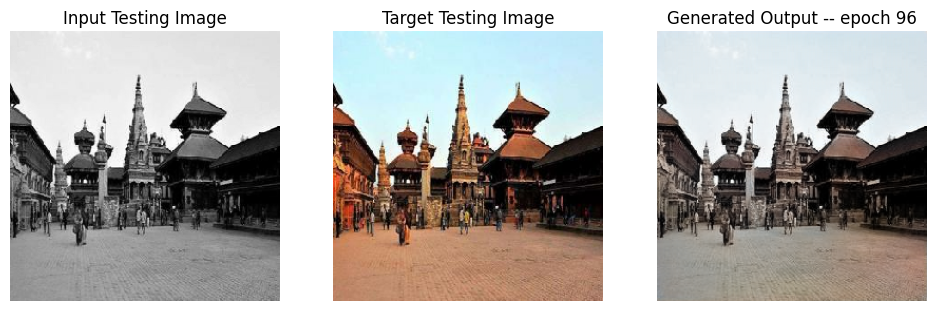

SSIM Score: 0.968339741230011
PSNR Score: 22.48750877380371
Reduced discriminator learning rate to 6.25000029685907e-05 at epoch 96.
Epoch 96
Training Details
Generator-- total_loss:10.57 gan_loss:7.07 l1_loss:0.03 Discriminator-- total_loss:0.20 real_loss:0.10 generated_loss:0.11 --- SSIM 0.95 PSNR 26.00
Time taken for epoch 97 is 113.89695310592651 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.51 gan_loss:0.32 l1_loss:0.04 Discriminator-- total_loss:2.31 real_loss:2.01 generated_loss:0.30 --- SSIM 0.94 PSNR 25.05
Time taken for epoch 97 is 126.84396696090698 sec
Number of iteration 70: and Lambda = 118.37656220839168
Epoch 97
Training Details
Generator-- total_loss:12.00 gan_loss:8.46 l1_loss:0.03 Discriminator-- total_loss:0.02 real_loss:0.01 generated_loss:0.01 --- SSIM 0.95 PSNR 25.99
Time taken for epoch 98 is 114.2881088256836 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.58 gan_loss:0.35 l1_loss:0.04 Discriminator-- total_lo

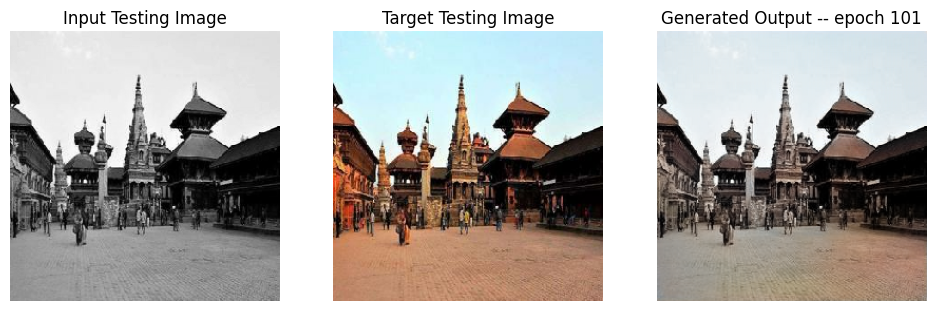

SSIM Score: 0.9699484705924988
PSNR Score: 23.055307388305664
Epoch 101
Training Details
Generator-- total_loss:14.18 gan_loss:10.52 l1_loss:0.03 Discriminator-- total_loss:0.03 real_loss:0.00 generated_loss:0.02 --- SSIM 0.95 PSNR 25.99
Time taken for epoch 102 is 114.97091150283813 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.55 gan_loss:0.17 l1_loss:0.04 Discriminator-- total_loss:3.59 real_loss:3.40 generated_loss:0.19 --- SSIM 0.94 PSNR 25.05
Time taken for epoch 102 is 128.0330684185028 sec
Number of iteration 70: and Lambda = 123.81130241221362
Epoch 102
Training Details
Generator-- total_loss:14.34 gan_loss:10.64 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.95 PSNR 26.00
Time taken for epoch 103 is 113.82380199432373 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.69 gan_loss:0.28 l1_loss:0.04 Discriminator-- total_loss:2.94 real_loss:2.64 generated_loss:0.30 --- SSIM 0.94 PSNR 25

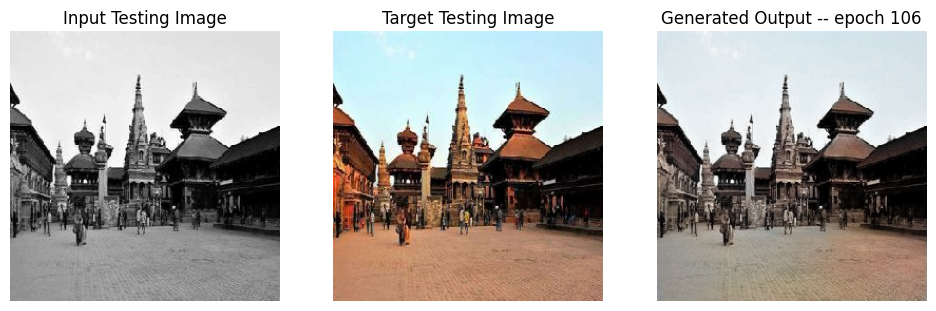

SSIM Score: 0.969979465007782
PSNR Score: 23.046724319458008
Epoch 106
Training Details
Generator-- total_loss:16.07 gan_loss:12.24 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.95 PSNR 25.99
Time taken for epoch 107 is 115.01141047477722 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.01 gan_loss:0.44 l1_loss:0.04 Discriminator-- total_loss:2.88 real_loss:2.36 generated_loss:0.53 --- SSIM 0.94 PSNR 25.05
Time taken for epoch 107 is 128.08943271636963 sec
Number of iteration 70: and Lambda = 129.49555485504652
Epoch 107
Training Details
Generator-- total_loss:15.71 gan_loss:11.84 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.95 PSNR 25.97
Time taken for epoch 108 is 114.9588611125946 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.97 gan_loss:0.35 l1_loss:0.04 Discriminator-- total_loss:3.18 real_loss:2.65 generated_loss:0.53 --- SSIM 0.94 PSNR 25.

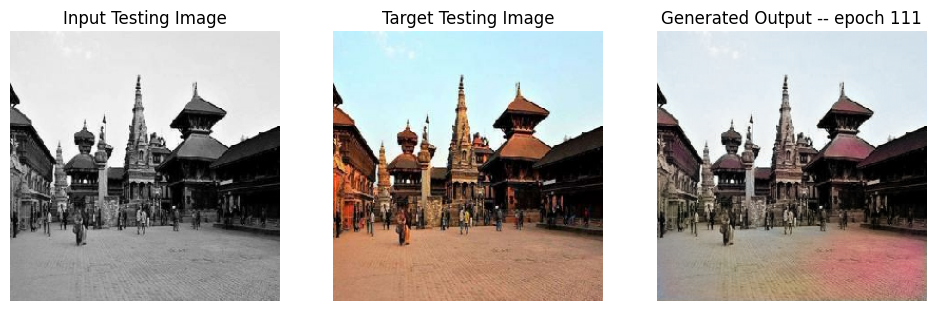

SSIM Score: 0.9656208157539368
PSNR Score: 23.324859619140625
Epoch 111
Training Details
Generator-- total_loss:4.13 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:8.79 real_loss:8.79 generated_loss:0.00 --- SSIM 0.95 PSNR 25.69
Time taken for epoch 112 is 105.36910080909729 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.81 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.29 real_loss:11.28 generated_loss:0.00 --- SSIM 0.95 PSNR 24.98
Time taken for epoch 112 is 118.44785451889038 sec
Number of iteration 70: and Lambda = 135.4407747960346
Epoch 112
Training Details
Generator-- total_loss:4.15 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:8.88 real_loss:8.88 generated_loss:0.00 --- SSIM 0.95 PSNR 25.76
Time taken for epoch 113 is 106.53371405601501 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.81 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.39 real_loss:11.39 generated_loss:0.00 --- SSIM 0.95 PSNR 25

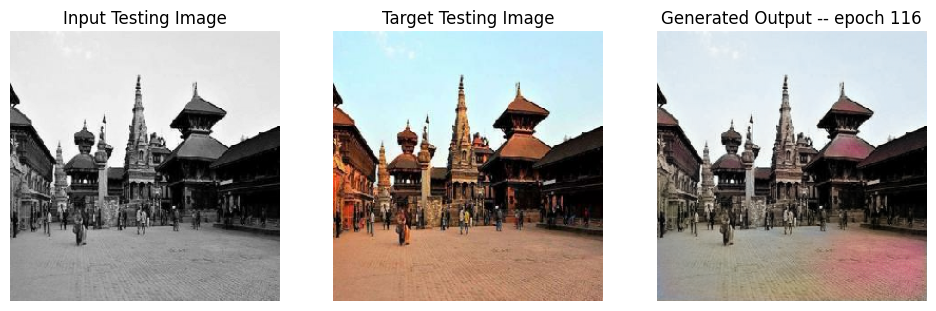

SSIM Score: 0.9656911492347717
PSNR Score: 23.027189254760742
Epoch 116
Training Details
Generator-- total_loss:4.26 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:8.66 real_loss:8.66 generated_loss:0.00 --- SSIM 0.96 PSNR 25.80
Time taken for epoch 117 is 106.14480924606323 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.02 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.05 real_loss:11.05 generated_loss:0.00 --- SSIM 0.95 PSNR 25.00
Time taken for epoch 117 is 119.2974305152893 sec
Number of iteration 70: and Lambda = 141.65894341225936
Reduced discriminator learning rate to 3.125000148429535e-05 at epoch 117.
Epoch 117
Training Details
Generator-- total_loss:9.44 gan_loss:5.15 l1_loss:0.03 Discriminator-- total_loss:0.40 real_loss:0.20 generated_loss:0.20 --- SSIM 0.96 PSNR 25.75
Time taken for epoch 118 is 114.62908506393433 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.83 gan_loss:0.81 l1_loss:0.04 Discriminator--

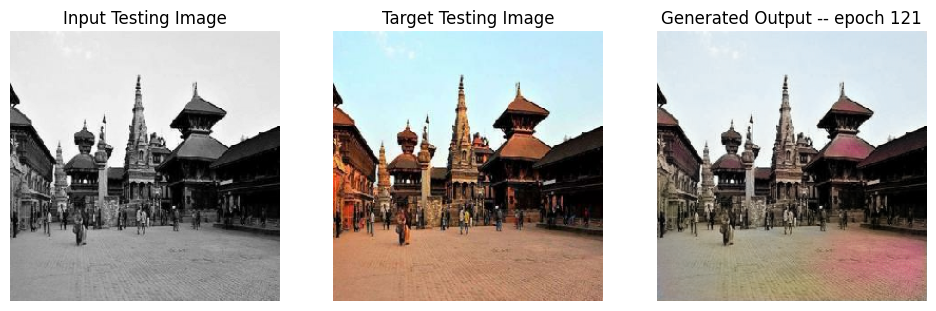

SSIM Score: 0.9680476188659668
PSNR Score: 23.7348690032959
Epoch 121
Training Details
Generator-- total_loss:10.86 gan_loss:6.40 l1_loss:0.03 Discriminator-- total_loss:0.09 real_loss:0.03 generated_loss:0.06 --- SSIM 0.96 PSNR 25.73
Time taken for epoch 122 is 115.79103779792786 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.49 gan_loss:0.29 l1_loss:0.04 Discriminator-- total_loss:2.09 real_loss:1.86 generated_loss:0.23 --- SSIM 0.95 PSNR 25.05
Time taken for epoch 122 is 129.13032937049866 sec
Number of iteration 70: and Lambda = 148.16259194395295
Epoch 122
Training Details
Generator-- total_loss:10.96 gan_loss:6.46 l1_loss:0.03 Discriminator-- total_loss:0.08 real_loss:0.03 generated_loss:0.05 --- SSIM 0.96 PSNR 25.74
Time taken for epoch 123 is 114.7296314239502 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.61 gan_loss:0.37 l1_loss:0.04 Discriminator-- total_loss:2.10 real_loss:1.82 generated_loss:0.28 --- SSIM 0.95 PSNR 25.05


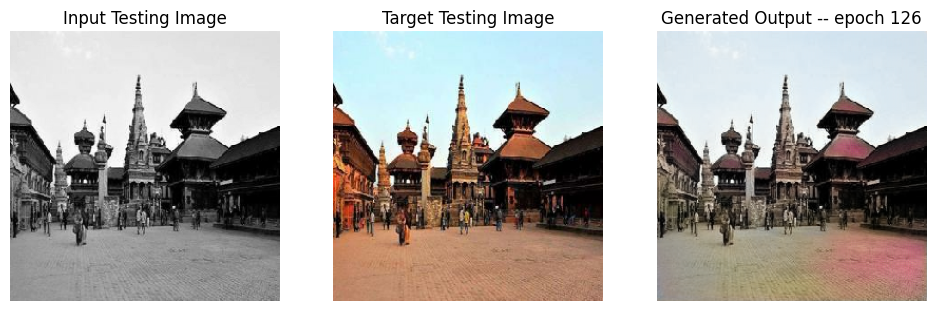

SSIM Score: 0.968008816242218
PSNR Score: 23.728038787841797
Epoch 126
Training Details
Generator-- total_loss:11.63 gan_loss:6.97 l1_loss:0.03 Discriminator-- total_loss:0.06 real_loss:0.03 generated_loss:0.04 --- SSIM 0.96 PSNR 25.73
Time taken for epoch 127 is 114.67611050605774 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.72 gan_loss:0.28 l1_loss:0.04 Discriminator-- total_loss:2.28 real_loss:2.06 generated_loss:0.21 --- SSIM 0.95 PSNR 25.05
Time taken for epoch 127 is 127.74038100242615 sec
Number of iteration 70: and Lambda = 154.96482694823308
Epoch 127
Training Details
Generator-- total_loss:12.18 gan_loss:7.46 l1_loss:0.03 Discriminator-- total_loss:0.04 real_loss:0.02 generated_loss:0.02 --- SSIM 0.96 PSNR 25.72
Time taken for epoch 128 is 114.0890724658966 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.66 gan_loss:0.17 l1_loss:0.04 Discriminator-- total_loss:2.70 real_loss:2.57 generated_loss:0.13 --- SSIM 0.95 PSNR 25.05

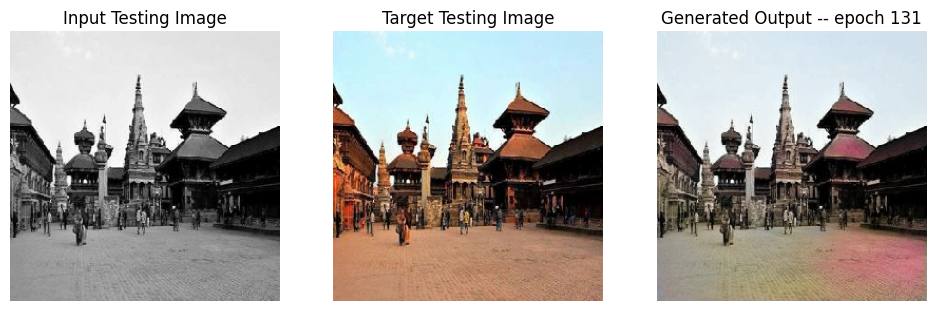

SSIM Score: 0.9679853320121765
PSNR Score: 23.710538864135742
Epoch 131
Training Details
Generator-- total_loss:12.75 gan_loss:7.86 l1_loss:0.03 Discriminator-- total_loss:0.04 real_loss:0.02 generated_loss:0.02 --- SSIM 0.96 PSNR 25.71
Time taken for epoch 132 is 114.91991353034973 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.07 gan_loss:0.39 l1_loss:0.04 Discriminator-- total_loss:2.06 real_loss:1.80 generated_loss:0.26 --- SSIM 0.95 PSNR 25.06
Time taken for epoch 132 is 128.02269744873047 sec
Number of iteration 70: and Lambda = 162.07935671225223
Epoch 132
Training Details
Generator-- total_loss:12.97 gan_loss:8.06 l1_loss:0.03 Discriminator-- total_loss:0.03 real_loss:0.01 generated_loss:0.02 --- SSIM 0.96 PSNR 25.74
Time taken for epoch 133 is 114.42769384384155 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.88 gan_loss:0.14 l1_loss:0.04 Discriminator-- total_loss:2.81 real_loss:2.70 generated_loss:0.11 --- SSIM 0.95 PSNR 25.

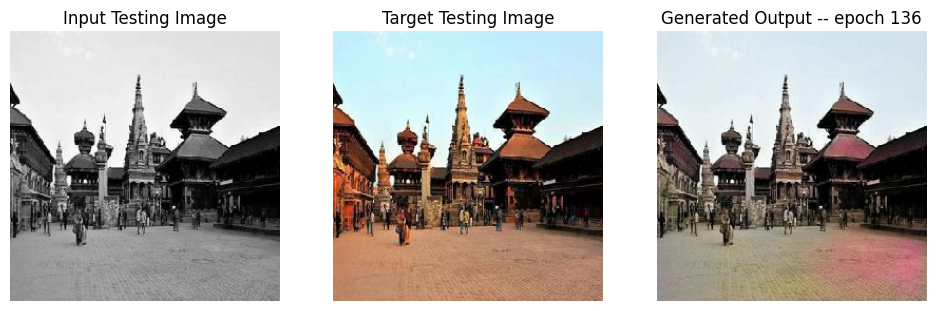

SSIM Score: 0.967918872833252
PSNR Score: 23.744462966918945
Epoch 136
Training Details
Generator-- total_loss:13.17 gan_loss:8.08 l1_loss:0.03 Discriminator-- total_loss:0.03 real_loss:0.01 generated_loss:0.02 --- SSIM 0.96 PSNR 25.74
Time taken for epoch 137 is 113.92444133758545 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.05 gan_loss:0.09 l1_loss:0.04 Discriminator-- total_loss:3.71 real_loss:3.66 generated_loss:0.06 --- SSIM 0.95 PSNR 25.05
Time taken for epoch 137 is 126.96397924423218 sec
Number of iteration 70: and Lambda = 169.5205188789909
Epoch 137
Training Details
Generator-- total_loss:13.63 gan_loss:8.48 l1_loss:0.03 Discriminator-- total_loss:0.02 real_loss:0.02 generated_loss:0.01 --- SSIM 0.96 PSNR 25.72
Time taken for epoch 138 is 113.91162419319153 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.63 gan_loss:0.63 l1_loss:0.04 Discriminator-- total_loss:2.48 real_loss:2.01 generated_loss:0.47 --- SSIM 0.95 PSNR 25.04

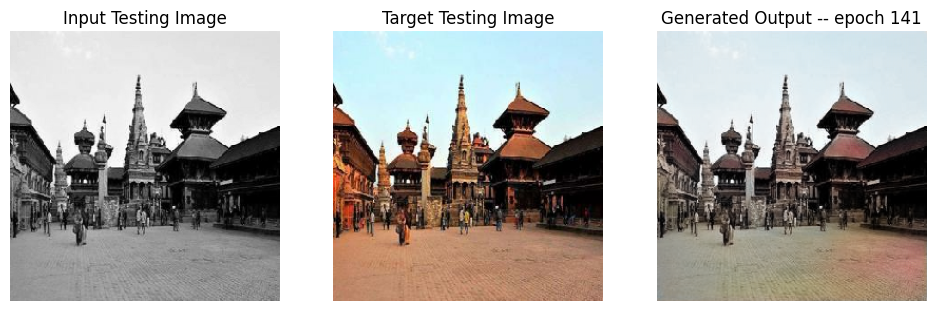

SSIM Score: 0.9694531559944153
PSNR Score: 23.181785583496094
Epoch 141
Training Details
Generator-- total_loss:5.34 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:8.47 real_loss:8.43 generated_loss:0.04 --- SSIM 0.95 PSNR 25.80
Time taken for epoch 142 is 105.39662909507751 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.36 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:8.98 real_loss:8.97 generated_loss:0.00 --- SSIM 0.94 PSNR 24.91
Time taken for epoch 142 is 118.42263746261597 sec
Number of iteration 70: and Lambda = 177.3033093413676
Epoch 142
Training Details
Generator-- total_loss:5.40 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:8.57 real_loss:8.53 generated_loss:0.04 --- SSIM 0.95 PSNR 25.79
Time taken for epoch 143 is 104.89090585708618 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.40 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:9.34 real_loss:9.34 generated_loss:0.00 --- SSIM 0.95 PSNR 24.92


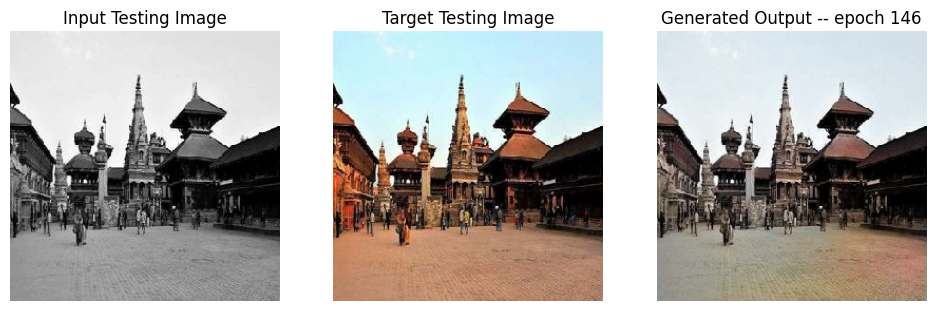

SSIM Score: 0.9705073237419128
PSNR Score: 23.209779739379883
Epoch 146
Training Details
Generator-- total_loss:5.56 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:8.68 real_loss:8.62 generated_loss:0.06 --- SSIM 0.95 PSNR 25.84
Time taken for epoch 147 is 104.91950225830078 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.61 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:9.59 real_loss:9.59 generated_loss:0.00 --- SSIM 0.94 PSNR 24.96
Time taken for epoch 147 is 117.95136451721191 sec
Number of iteration 70: and Lambda = 185.44341246289497
Epoch 147
Training Details
Generator-- total_loss:5.61 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:8.74 real_loss:8.70 generated_loss:0.04 --- SSIM 0.95 PSNR 25.84
Time taken for epoch 148 is 105.19822025299072 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.61 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:9.25 real_loss:9.25 generated_loss:0.00 --- SSIM 0.94 PSNR 25.04

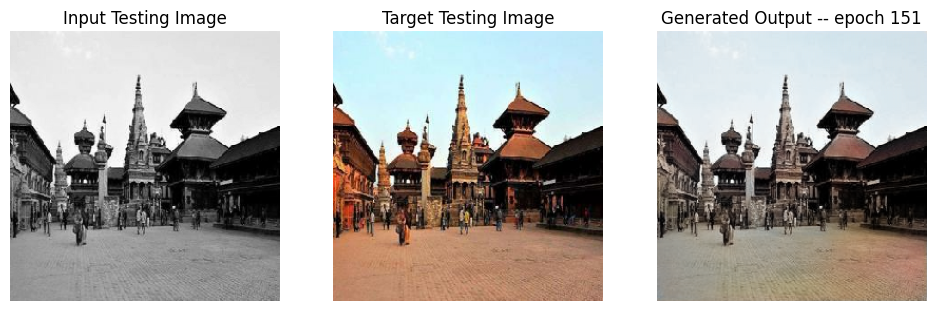

SSIM Score: 0.9707254767417908
PSNR Score: 23.248735427856445
Epoch 151
Training Details
Generator-- total_loss:10.87 gan_loss:5.08 l1_loss:0.03 Discriminator-- total_loss:0.25 real_loss:0.09 generated_loss:0.16 --- SSIM 0.95 PSNR 25.85
Time taken for epoch 152 is 114.88708090782166 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:7.26 gan_loss:0.36 l1_loss:0.04 Discriminator-- total_loss:2.11 real_loss:1.74 generated_loss:0.37 --- SSIM 0.94 PSNR 24.97
Time taken for epoch 152 is 127.82821369171143 sec
Number of iteration 70: and Lambda = 193.95723268578521
Epoch 152
Training Details
Generator-- total_loss:11.42 gan_loss:5.57 l1_loss:0.03 Discriminator-- total_loss:0.17 real_loss:0.07 generated_loss:0.10 --- SSIM 0.95 PSNR 25.83
Time taken for epoch 153 is 113.86367583274841 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:7.34 gan_loss:0.38 l1_loss:0.04 Discriminator-- total_loss:2.19 real_loss:1.82 generated_loss:0.37 --- SSIM 0.94 PSNR 24.

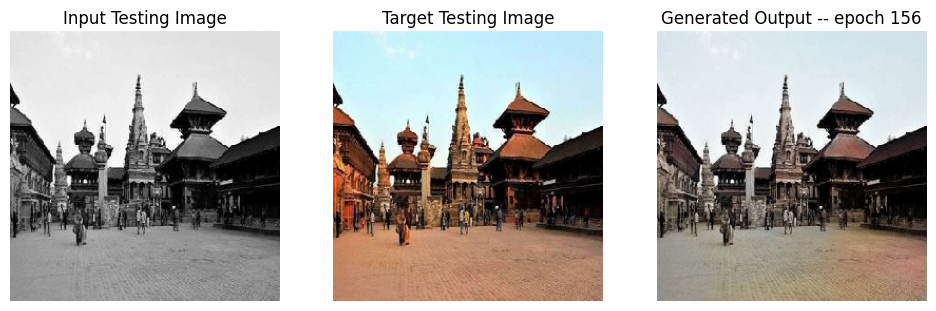

SSIM Score: 0.9707028865814209
PSNR Score: 23.19263458251953
Epoch 156
Training Details
Generator-- total_loss:12.87 gan_loss:6.81 l1_loss:0.03 Discriminator-- total_loss:0.03 real_loss:0.01 generated_loss:0.01 --- SSIM 0.95 PSNR 25.84
Time taken for epoch 157 is 114.69839262962341 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:7.52 gan_loss:0.31 l1_loss:0.04 Discriminator-- total_loss:2.32 real_loss:1.98 generated_loss:0.34 --- SSIM 0.94 PSNR 24.96
Time taken for epoch 157 is 127.93202900886536 sec
Number of iteration 70: and Lambda = 202.8619275902023
Reduced generator learning rate to 7.812500371073838e-06 at epoch 157
Epoch 157
Training Details
Generator-- total_loss:6.61 gan_loss:0.19 l1_loss:0.03 Discriminator-- total_loss:5.20 real_loss:5.17 generated_loss:0.03 --- SSIM 0.95 PSNR 25.38
Time taken for epoch 158 is 106.08423566818237 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:7.46 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_

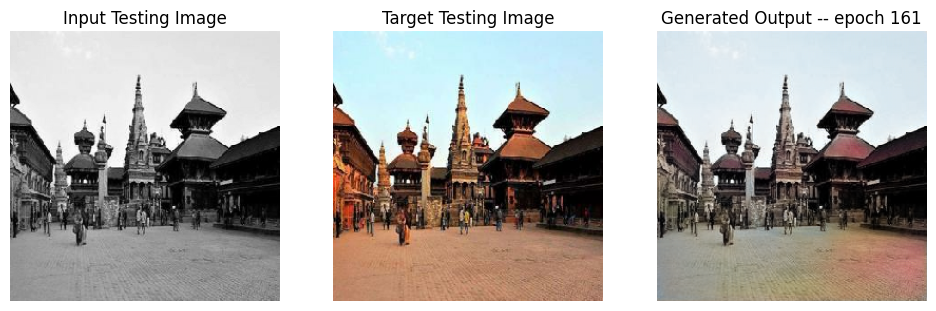

SSIM Score: 0.9674569964408875
PSNR Score: 23.047929763793945
Epoch 161
Training Details
Generator-- total_loss:6.62 gan_loss:0.04 l1_loss:0.03 Discriminator-- total_loss:5.73 real_loss:5.71 generated_loss:0.03 --- SSIM 0.95 PSNR 25.44
Time taken for epoch 162 is 106.4675817489624 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:7.73 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:7.87 real_loss:7.87 generated_loss:0.00 --- SSIM 0.94 PSNR 24.73
Time taken for epoch 162 is 119.7554841041565 sec
Number of iteration 70: and Lambda = 212.17544247128515
Epoch 162
Training Details
Generator-- total_loss:6.66 gan_loss:0.05 l1_loss:0.03 Discriminator-- total_loss:5.75 real_loss:5.74 generated_loss:0.02 --- SSIM 0.95 PSNR 25.45
Time taken for epoch 163 is 105.26041030883789 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:7.78 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:7.99 real_loss:7.98 generated_loss:0.00 --- SSIM 0.94 PSNR 24.75
T

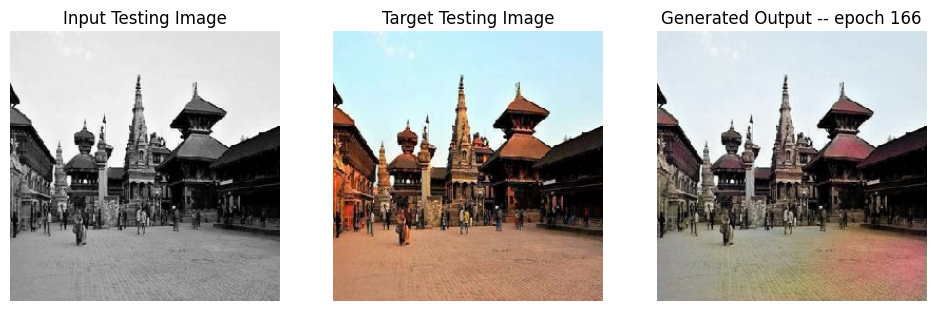

SSIM Score: 0.9677241444587708
PSNR Score: 23.269407272338867
Epoch 166
Training Details
Generator-- total_loss:9.89 gan_loss:3.06 l1_loss:0.03 Discriminator-- total_loss:0.78 real_loss:0.30 generated_loss:0.48 --- SSIM 0.95 PSNR 25.53
Time taken for epoch 167 is 114.45448803901672 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:8.74 gan_loss:0.72 l1_loss:0.04 Discriminator-- total_loss:1.51 real_loss:0.98 generated_loss:0.52 --- SSIM 0.94 PSNR 24.80
Time taken for epoch 167 is 127.63711738586426 sec
Number of iteration 70: and Lambda = 221.91654650362256
Epoch 167
Training Details
Generator-- total_loss:9.89 gan_loss:3.00 l1_loss:0.03 Discriminator-- total_loss:0.74 real_loss:0.27 generated_loss:0.47 --- SSIM 0.95 PSNR 25.54
Time taken for epoch 168 is 114.61501574516296 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:8.76 gan_loss:0.67 l1_loss:0.04 Discriminator-- total_loss:1.53 real_loss:1.05 generated_loss:0.48 --- SSIM 0.94 PSNR 24.81

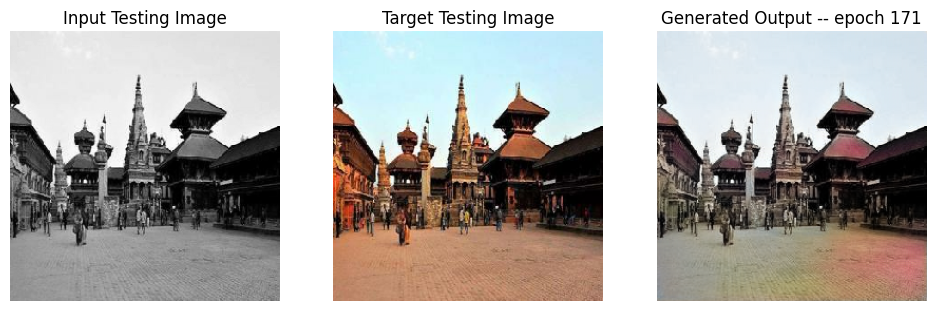

SSIM Score: 0.9675599932670593
PSNR Score: 23.199209213256836
Reduced generator learning rate to 3.906250185536919e-06 at epoch 171
Epoch 171
Training Details
Generator-- total_loss:7.77 gan_loss:0.26 l1_loss:0.03 Discriminator-- total_loss:3.74 real_loss:3.43 generated_loss:0.30 --- SSIM 0.95 PSNR 25.10
Time taken for epoch 172 is 105.95404934883118 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:8.66 gan_loss:0.06 l1_loss:0.04 Discriminator-- total_loss:3.47 real_loss:3.42 generated_loss:0.04 --- SSIM 0.94 PSNR 24.59
Time taken for epoch 172 is 119.12568092346191 sec
Number of iteration 70: and Lambda = 232.1048705660615
Epoch 172
Training Details
Generator-- total_loss:7.67 gan_loss:0.10 l1_loss:0.03 Discriminator-- total_loss:4.34 real_loss:4.01 generated_loss:0.33 --- SSIM 0.95 PSNR 25.11
Time taken for epoch 173 is 105.0553982257843 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:8.66 gan_loss:0.05 l1_loss:0.04 Discriminator-- total_l

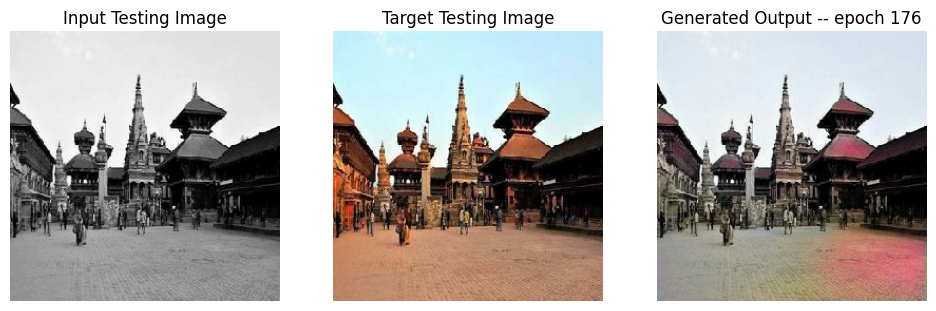

SSIM Score: 0.9629400372505188
PSNR Score: 22.577354431152344
Epoch 176
Training Details
Generator-- total_loss:7.82 gan_loss:0.10 l1_loss:0.03 Discriminator-- total_loss:4.60 real_loss:4.25 generated_loss:0.35 --- SSIM 0.95 PSNR 25.26
Time taken for epoch 177 is 105.55900001525879 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:8.96 gan_loss:0.04 l1_loss:0.04 Discriminator-- total_loss:3.97 real_loss:3.93 generated_loss:0.04 --- SSIM 0.95 PSNR 24.64
Time taken for epoch 177 is 118.74897718429565 sec
Number of iteration 70: and Lambda = 242.7609468030756
Epoch 177
Training Details
Generator-- total_loss:7.87 gan_loss:0.09 l1_loss:0.03 Discriminator-- total_loss:4.48 real_loss:4.22 generated_loss:0.27 --- SSIM 0.95 PSNR 25.27
Time taken for epoch 178 is 106.01070284843445 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:9.01 gan_loss:0.05 l1_loss:0.04 Discriminator-- total_loss:3.87 real_loss:3.83 generated_loss:0.04 --- SSIM 0.95 PSNR 24.72


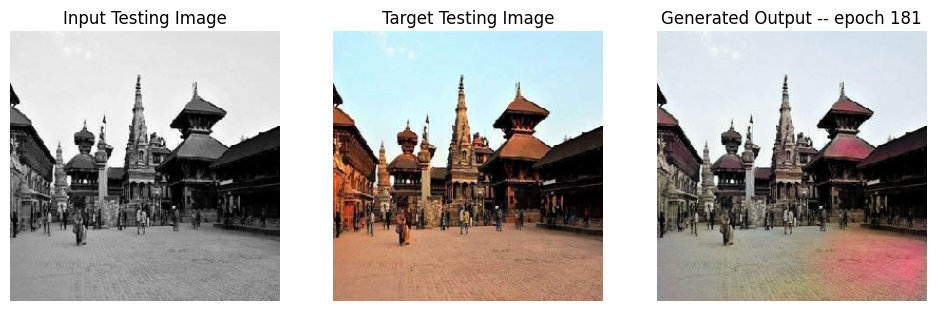

SSIM Score: 0.9637705683708191
PSNR Score: 22.640893936157227
Epoch 181
Training Details
Generator-- total_loss:9.52 gan_loss:1.46 l1_loss:0.03 Discriminator-- total_loss:1.62 real_loss:0.66 generated_loss:0.95 --- SSIM 0.95 PSNR 25.24
Time taken for epoch 182 is 114.12796902656555 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:10.20 gan_loss:0.93 l1_loss:0.04 Discriminator-- total_loss:1.31 real_loss:0.74 generated_loss:0.57 --- SSIM 0.95 PSNR 24.67
Time taken for epoch 182 is 127.17244696617126 sec
Number of iteration 70: and Lambda = 253.9062500024198
Epoch 182
Training Details
Generator-- total_loss:9.64 gan_loss:1.53 l1_loss:0.03 Discriminator-- total_loss:1.38 real_loss:0.59 generated_loss:0.79 --- SSIM 0.95 PSNR 25.23
Time taken for epoch 183 is 114.46760869026184 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:10.26 gan_loss:0.90 l1_loss:0.04 Discriminator-- total_loss:1.31 real_loss:0.76 generated_loss:0.56 --- SSIM 0.95 PSNR 24.6

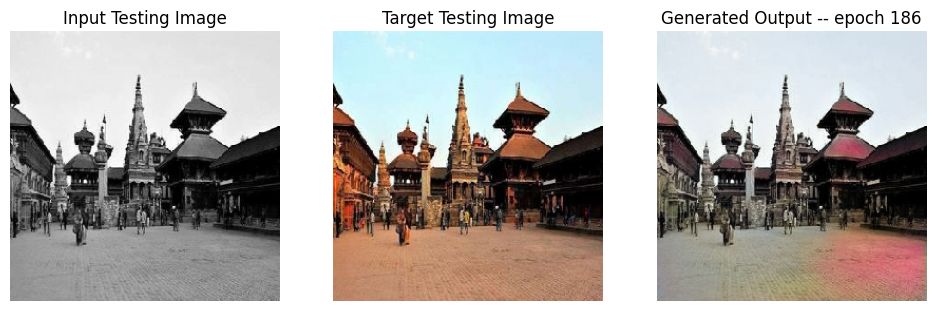

SSIM Score: 0.9638392925262451
PSNR Score: 22.65205192565918
Reduced generator learning rate to 1.9531250927684596e-06 at epoch 186
Epoch 186
Training Details
Generator-- total_loss:9.28 gan_loss:0.57 l1_loss:0.03 Discriminator-- total_loss:2.30 real_loss:1.65 generated_loss:0.65 --- SSIM 0.95 PSNR 24.87
Time taken for epoch 187 is 105.39127111434937 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:10.45 gan_loss:0.40 l1_loss:0.04 Discriminator-- total_loss:1.78 real_loss:1.54 generated_loss:0.23 --- SSIM 0.94 PSNR 24.28
Time taken for epoch 187 is 118.31916642189026 sec
Number of iteration 70: and Lambda = 265.56324087245866
Epoch 187
Training Details
Generator-- total_loss:9.09 gan_loss:0.24 l1_loss:0.03 Discriminator-- total_loss:3.06 real_loss:2.40 generated_loss:0.67 --- SSIM 0.95 PSNR 24.79
Time taken for epoch 188 is 104.92712163925171 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:10.37 gan_loss:0.29 l1_loss:0.04 Discriminator-- tot

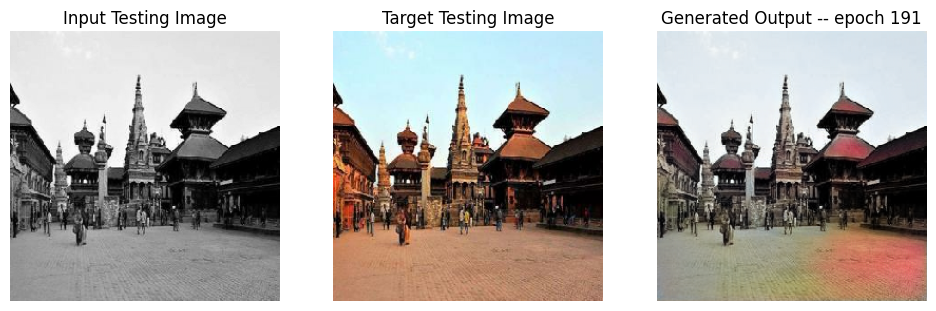

SSIM Score: 0.9639506340026855
PSNR Score: 22.67218017578125
Epoch 191
Training Details
Generator-- total_loss:9.26 gan_loss:0.21 l1_loss:0.03 Discriminator-- total_loss:3.40 real_loss:2.76 generated_loss:0.63 --- SSIM 0.95 PSNR 24.90
Time taken for epoch 192 is 105.68076920509338 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:10.66 gan_loss:0.24 l1_loss:0.04 Discriminator-- total_loss:2.44 real_loss:2.24 generated_loss:0.19 --- SSIM 0.94 PSNR 24.41
Time taken for epoch 192 is 118.72656512260437 sec
Number of iteration 70: and Lambda = 277.75541130638334
Epoch 192
Training Details
Generator-- total_loss:9.30 gan_loss:0.21 l1_loss:0.03 Discriminator-- total_loss:3.43 real_loss:2.81 generated_loss:0.62 --- SSIM 0.95 PSNR 24.94
Time taken for epoch 193 is 104.99747276306152 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:10.73 gan_loss:0.21 l1_loss:0.04 Discriminator-- total_loss:2.59 real_loss:2.41 generated_loss:0.18 --- SSIM 0.94 PSNR 24.4

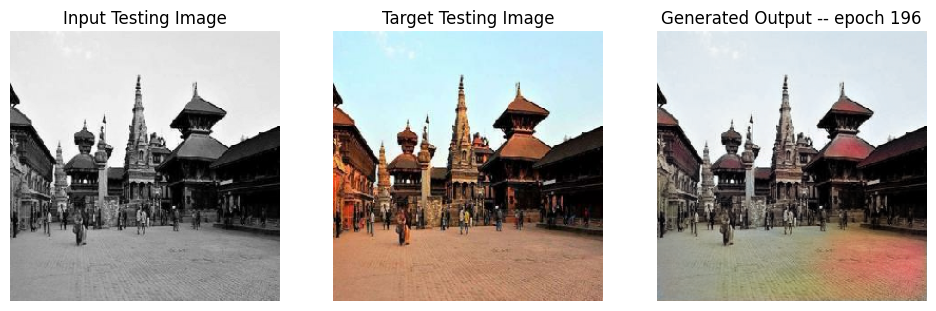

SSIM Score: 0.9652626514434814
PSNR Score: 22.696504592895508
Epoch 196
Training Details
Generator-- total_loss:9.55 gan_loss:0.21 l1_loss:0.03 Discriminator-- total_loss:3.62 real_loss:2.96 generated_loss:0.66 --- SSIM 0.95 PSNR 25.00
Time taken for epoch 197 is 106.1931848526001 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:11.13 gan_loss:0.22 l1_loss:0.04 Discriminator-- total_loss:2.68 real_loss:2.48 generated_loss:0.20 --- SSIM 0.94 PSNR 24.39
Time taken for epoch 197 is 119.46298909187317 sec
Number of iteration 70: and Lambda = 290.507331724536
Epoch 197
Training Details
Generator-- total_loss:9.63 gan_loss:0.21 l1_loss:0.03 Discriminator-- total_loss:3.69 real_loss:3.05 generated_loss:0.64 --- SSIM 0.95 PSNR 25.01
Time taken for epoch 198 is 106.11148405075073 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:11.17 gan_loss:0.18 l1_loss:0.04 Discriminator-- total_loss:2.88 real_loss:2.71 generated_loss:0.17 --- SSIM 0.94 PSNR 24.41


In [41]:
fit(train_dataset, epochs, test_dataset, gen)

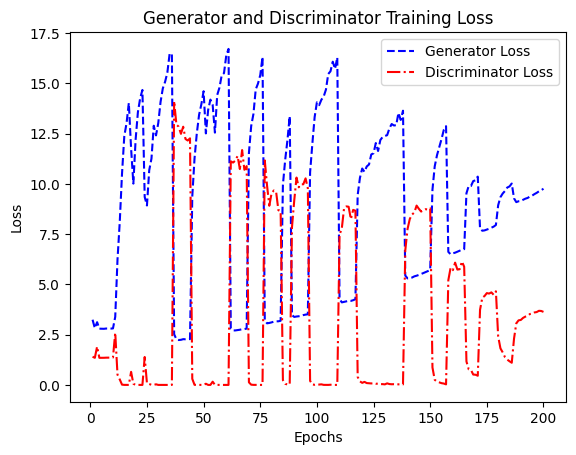

In [42]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

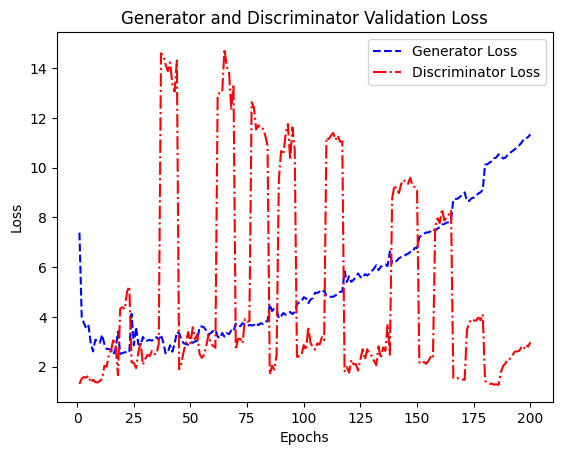

In [43]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

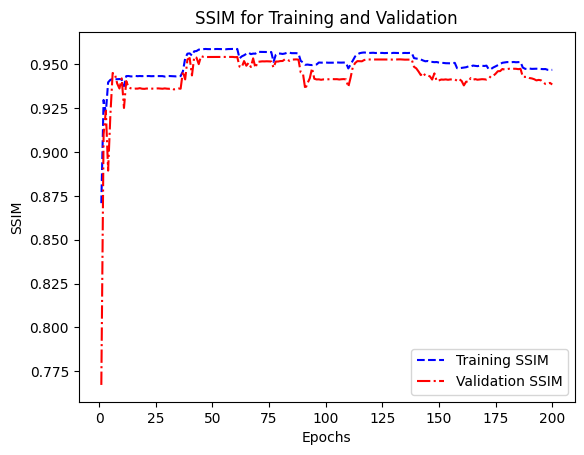

In [44]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

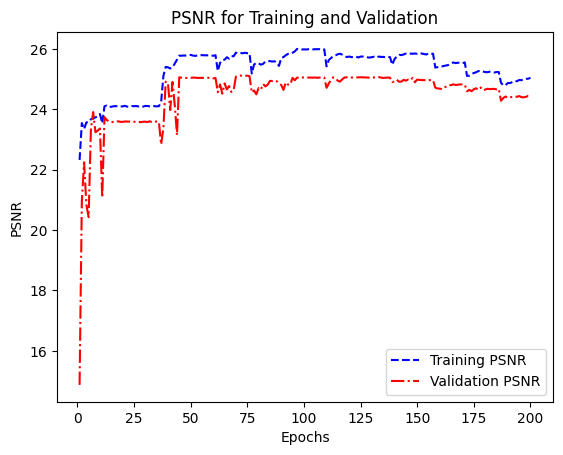

In [45]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

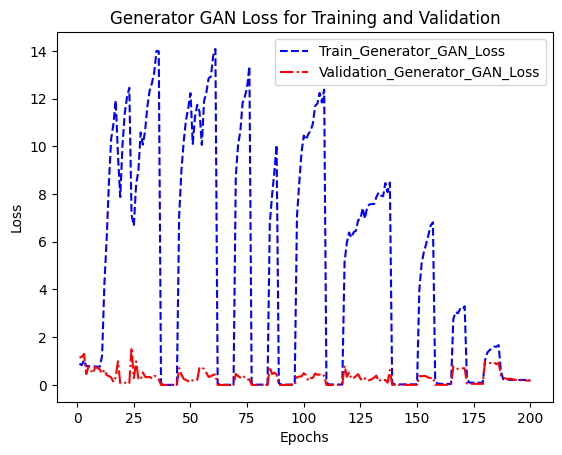

In [46]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

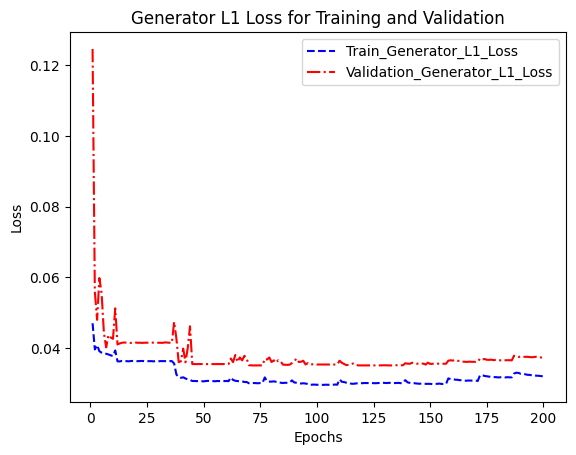

In [47]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

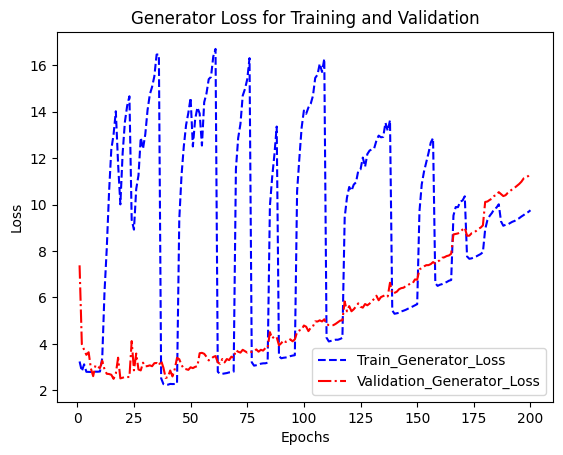

In [48]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

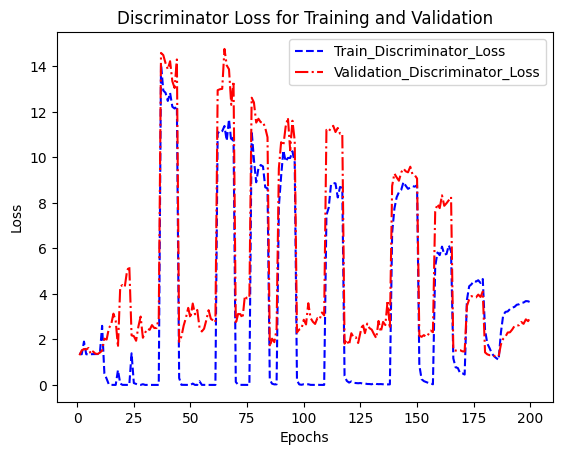

In [49]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

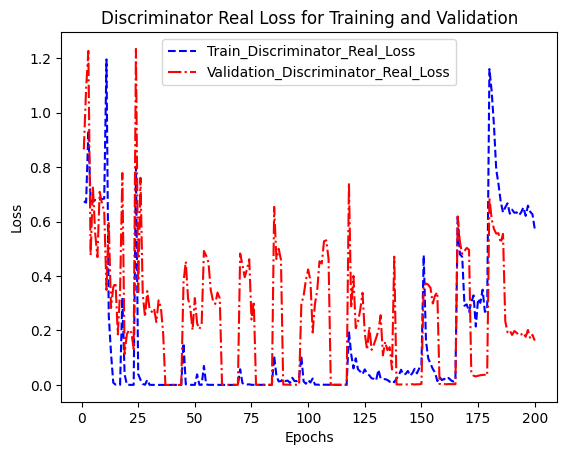

In [50]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

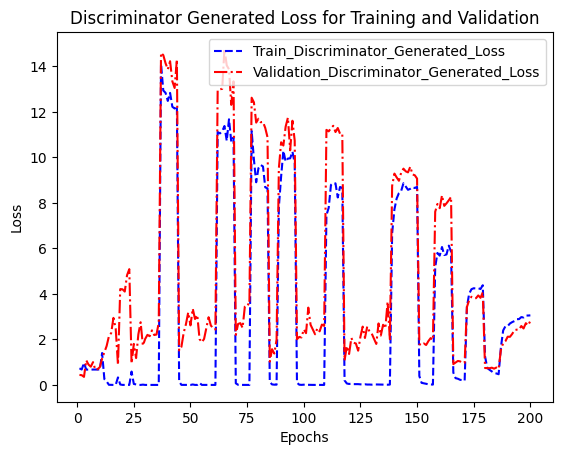

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [52]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [53]:
os.mkdir('/kaggle/working/modelsJan20')

In [54]:
gen.save('/kaggle/working/modelsJan20/gen.h5')
gen.save_weights('/kaggle/working/modelsJan20/gen.keras')
disc.save('/kaggle/working/modelsJan20/disc.h5')
disc.save_weights('/kaggle/working/modelsJan20/disc.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [55]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [56]:
import subprocess
from IPython.display import FileLink, display

In [57]:
download_file('/kaggle/working', 'outputJan20')

/kaggle/working/outputJan20.zip